In [ ]:
# to do: 
# set up structure for process of data exploration - should we do this outside of the notebook? or right after lecture together? 
# figure out markdown 
# turn off type hints? how to set up chat 

In [73]:
import pynwb 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [74]:
# Metadata explorations 

In [75]:
# Load metadata CSV 
metadata = pd.read_csv('/data/metadata/V1DD_metadata.csv', index_col = False) 
metadata.head()

# each row is a session 

,project_name,_id,name,subject_id,golden_mouse,genotype,date_of_birth,sex,modality,session_date,age,session_time,column,volume
0,V1 Deep Dive,3b85c659-20c8-438f-ab58-de1aac3b81cf,416296_2018-11-29_12-08-40_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-11-29,115,12:08:40.014190,2,5
1,V1 Deep Dive,b98ce4a9-a66b-4b70-baa6-95ef451ae087,427836_2019-04-25_12-16-58_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-25,199,12:16:58.240890,5,3
2,V1 Deep Dive,5cccd09c-4ae8-4d8e-ae92-23099d22bbe2,427836_2019-04-24_13-06-45_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-24,198,13:06:45.257460,4,3
3,V1 Deep Dive,911d215f-dafa-4b39-86f7-b36336974da1,427836_2019-04-25_13-49-39_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-25,199,13:49:39.163550,5,4
4,V1 Deep Dive,c918f874-d534-4341-b0dc-f1aba388af66,427836_2019-04-26_12-54-40_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-26,200,12:54:40.332660,2,4


In [76]:
# to do: set up a dataset specific README and keep it open side-by-side to document useful information. 

In [77]:
# What metadata is available? 
metadata.columns

Index(['project_name', '_id', 'name', 'subject_id', 'golden_mouse', 'genotype',
       'date_of_birth', 'sex', 'modality', 'session_date', 'age',
       'session_time', 'column', 'volume'],
      dtype='object')

In [78]:
# What data modalities are available 
metadata.modality.unique()

# something to call out - behavior videos are not available but processed behavior data 

array(["['Planar optical physiology', 'Behavior videos']"], dtype=object)

In [79]:
# How many subjects in the dataset? 
metadata.subject_id.nunique()

4

In [80]:
# Number of sessions per subject 
metadata.subject_id.value_counts()

subject_id
416296    25
427836    25
438833    25
409828    25
Name: count, dtype: int64

In [81]:
# What are the column/volumes? 

metadata[['column', 'volume']].value_counts()

# for each subject, a volume within a structural column in V1 was imaged 

column  volume
1       1         4
        2         4
        3         4
        4         4
        5         4
2       1         4
        2         4
        3         4
        4         4
        5         4
3       1         4
        2         4
        3         4
        4         4
        5         4
4       1         4
        2         4
        3         4
        4         4
        5         4
5       1         4
        2         4
        3         4
        4         4
        5         4
Name: count, dtype: int64

In [82]:
# What are unique genotypes in the dataset? 
#(try using set instead of unique) 
set(metadata.genotype)

# In plain language, what are the genotypes? Refer to the data book documentation  

{'Camk2a-tTA/wt;tetO-GCaMP6s/wt',
 'Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-GCaMP6s)/wt'}

In [83]:
# Inspect /data folder, how is it structured? 

# add to README 
# by subject 
# nwb container per session (unique column and volume) 

# session data is in nwb.zarr format 

### Neurodata Without Borders (NWB) files

NWB files are a standardized file format for neurophysiology data. They are formatted similarly to hdf5 containers, with data stored using a directory format. There are "containers" (i.e. directories) that store each type of data.  

The key types of data in an NWB file are: 
* metadata (subject information, recording methodology, devices used, etc.)
* stimulus tables (trial information about the stimuli) 
* timeseries 

(add more to this) 
    
The NWB files are in ZArray (Zarr) format. To load the files into Python, we'll use pynwb. 

In [57]:
# Open a single NWB session 

selected_path = '/root/capsule/data/409828_V1DD_Filtered/409828_2018-11-06_14-02-59_filtered_2026-04-09_04-59-00/409828_2018-11-06_14-02-59.nwb.zarr'
nwb = pynwb.read_nwb(selected_path)

nwb

root pynwb.file.NWBFile at 0x139750184431840
Fields:
  acquisition: {
    vasculature_maps <class 'pynwb.base.Images'>
  }
  devices: {
    DEEPSCOPE <class 'pynwb.device.Device'>
  }
  epochs: epochs <class 'pynwb.epoch.TimeIntervals'>
  experiment_description: 2-photon imaging of column 2, volume 1
  file_create_date: [datetime.datetime(2025, 12, 15, 19, 45, 15, 752494, tzinfo=tzoffset(None, -28800))]
  identifier: 992c7efa-1f27-431d-a5cc-94e8a81aafa8
  imaging_planes: {
    plane-0 <class 'pynwb.ophys.ImagingPlane'>,
    plane-1 <class 'pynwb.ophys.ImagingPlane'>,
    plane-2 <class 'pynwb.ophys.ImagingPlane'>,
    plane-3 <class 'pynwb.ophys.ImagingPlane'>,
    plane-4 <class 'pynwb.ophys.ImagingPlane'>,
    plane-5 <class 'pynwb.ophys.ImagingPlane'>
  }
  institution: Allen Institute
  intervals: {
    epochs <class 'pynwb.epoch.TimeIntervals'>,
    stimulus_table <class 'pynwb.epoch.TimeIntervals'>
  }
  keywords: <zarr.core.Array '/general/keywords' (4,) object read-only>
  processing: {
    behavior <class 'pynwb.base.ProcessingModule'>,
    plane-0 <class 'pynwb.base.ProcessingModule'>,
    plane-1 <class 'pynwb.base.ProcessingModule'>,
    plane-2 <class 'pynwb.base.ProcessingModule'>,
    plane-3 <class 'pynwb.base.ProcessingModule'>,
    plane-4 <class 'pynwb.base.ProcessingModule'>,
    plane-5 <class 'pynwb.base.ProcessingModule'>
  }
  session_description: V1 Deep Dive, Golden Mouse
  session_id: 774328450
  session_start_time: 2018-11-06 14:02:59-08:00
  stimulus: {
    locally_sparse_noise <class 'pynwb.base.Images'>,
    natural_images <class 'pynwb.base.Images'>,
    natural_movie <class 'pynwb.base.Images'>
  }
  subject: subject pynwb.file.Subject at 0x139750183528128
Fields:
  age: 126
  age__reference: birth
  description: Golden Mouse
  genotype: Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94
  sex: male
  species: Mus musculus
  subject_id: 409828

  timestamps_reference_time: 2018-11-06 14:02:59-08:00

In [58]:
# Explore data structure 

# Where are the key data pieces and how is it structured/formatted? 
# Neural activity 
# Behavior data 
# Stimulus tables 

# Is there other data that you didn't expect that might be useful? 
# E.g. stimulus images 

In [59]:
# To extract data from the NWB file, use a mix of dot notation and dictionary-style indexing.
# Question - how do you know when to use the dot notation vs dictionary keys 


# Get neural activity and see how it's structured 

# processing has behavior data and planes - each volume contains 6 planes. open up data for a single plane. 
# use . to see options

nwb.processing

{'behavior': behavior pynwb.base.ProcessingModule at 0x139750317503216
 Fields:
   data_interfaces: {
     eye_tracking <class 'hdmf.common.table.DynamicTable'>,
     running_speed <class 'pynwb.base.TimeSeries'>
   }
   description: processed behavioral data,
 'plane-0': plane-0 pynwb.base.ProcessingModule at 0x139750318980464
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-1': plane-1 pynwb.base.ProcessingModule at 0x139750054723552
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-2': plane-2 pynwb.base.ProcessingModule at 0x139750184430208
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-3': plane-3 pynwb.base.ProcessingModule at 0x139750081150896
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-4': plane-4 pynwb.base.ProcessingModule at 0x139750052792224
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-5': plane-5 pynwb.base.ProcessingModule at 0x139750052793424
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module}

In [60]:
# What is in each of these containers? 

nwb.processing['plane-0']

Data type,float32
Shape,"(22029, 9)"
Array size,774.46 KiB
Data type,float64
Shape,"(22029,)"
Array size,172.10 KiB
Data type,float64
Shape,"(3,)"
Array size,24.00 bytes
Data type,float64
Shape,"(2,)"


In [61]:
# Say something about processing - we have access to raw, neuropil, and processed (dff) data 
# Which do we want to use? likely dff. Say something about what this means 

# Under dff there's timeseries and and roi table. we need to use both 

dff = nwb.processing['plane-0']['dff'].data
print(np.shape(dff))

ts = nwb.processing['plane-0']['dff'].timestamps[:]
print(np.shape(ts))

# Assume this is frames x ROIs? 

(22029, 9)
(22029,)


In [62]:
# Maybe put this first? 
# 
nwb.processing['plane-0']['dff'].rois.to_dataframe()

# things to note - ROI is not continuous, only 7. why do you think that is? 
# say something about QC - only the good ROIs were kept in this dataset 

# how can I see all ROIs? 

,column,volume,plane,roi,pika_roi_id,pika_roi_confidence,is_soma,pixel_mask
id,,,,,,,,
0,2,1,0,0,774393041_0000,0.916531,True,"[[115, 260, 1.0], [112, 261, 1.0], [113, 261, ..."
1,2,1,0,1,774393041_0001,0.916861,True,"[[207, 284, 1.0], [208, 284, 1.0], [209, 284, ..."
2,2,1,0,2,774393041_0002,0.913705,True,"[[247, 97, 1.0], [248, 97, 1.0], [244, 98, 1.0..."
3,2,1,0,4,774393041_0004,0.915848,True,"[[159, 335, 1.0], [160, 335, 1.0], [161, 335, ..."
4,2,1,0,5,774393041_0005,0.912224,True,"[[135, 358, 1.0], [136, 358, 1.0], [137, 358, ..."
5,2,1,0,7,774393041_0007,0.912520,True,"[[390, 463, 1.0], [391, 463, 1.0], [392, 463, ..."
6,2,1,0,9,774393041_0009,0.916683,True,"[[300, 343, 1.0], [301, 343, 1.0], [302, 343, ..."
7,2,1,0,65,774393041_0066,0.912281,True,"[[142, 273, 1.0], [143, 273, 1.0], [144, 273, ..."
8,2,1,0,149,774393041_0151,0.522310,True,"[[344, 448, 1.0], [345, 448, 1.0], [346, 448, ..."


Text(0.5, 1.0, 'Max Projection of Session Imaging Frames')

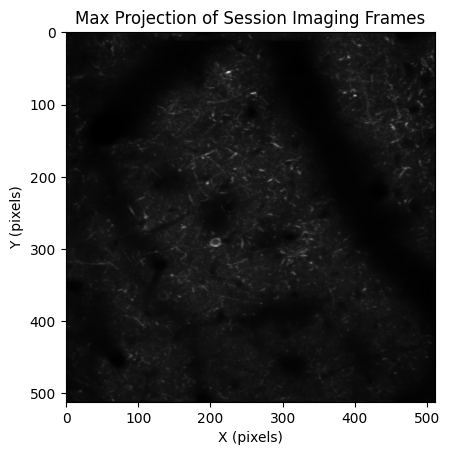

In [63]:
# A note about QC - plot all ROIs and the ones that were kept 

max_projection = nwb.processing['plane-0']['images']['max_projection_denoised_plane-0']

plt.imshow(max_projection,
           cmap="gray", 
           origin='upper')

plt.xlabel('X (pixels)') 
plt.ylabel('Y (pixels)')
plt.title('Max Projection of Session Imaging Frames') 

In [64]:
roi_table = nwb.processing['plane-0']['image_segmentation']['roi_table'].to_dataframe()
roi_table

# Features to call out and store here - 
# What is pika_roi_id? pika_roi_confidence? 

# is_soma - all are true, indicating that this is probably filtered for good ROIs 
# pixel_masks - other calcium imaging datasets will have image masks, hxw sparse arrays 

,column,volume,plane,roi,pika_roi_id,pika_roi_confidence,is_soma,pixel_mask
id,,,,,,,,
0,2,1,0,0,774393041_0000,0.916531,True,"[[115, 260, 1.0], [112, 261, 1.0], [113, 261, ..."
1,2,1,0,1,774393041_0001,0.916861,True,"[[207, 284, 1.0], [208, 284, 1.0], [209, 284, ..."
2,2,1,0,2,774393041_0002,0.913705,True,"[[247, 97, 1.0], [248, 97, 1.0], [244, 98, 1.0..."
3,2,1,0,4,774393041_0004,0.915848,True,"[[159, 335, 1.0], [160, 335, 1.0], [161, 335, ..."
4,2,1,0,5,774393041_0005,0.912224,True,"[[135, 358, 1.0], [136, 358, 1.0], [137, 358, ..."
5,2,1,0,7,774393041_0007,0.912520,True,"[[390, 463, 1.0], [391, 463, 1.0], [392, 463, ..."
6,2,1,0,9,774393041_0009,0.916683,True,"[[300, 343, 1.0], [301, 343, 1.0], [302, 343, ..."
7,2,1,0,65,774393041_0066,0.912281,True,"[[142, 273, 1.0], [143, 273, 1.0], [144, 273, ..."
8,2,1,0,149,774393041_0151,0.522310,True,"[[344, 448, 1.0], [345, 448, 1.0], [346, 448, ..."


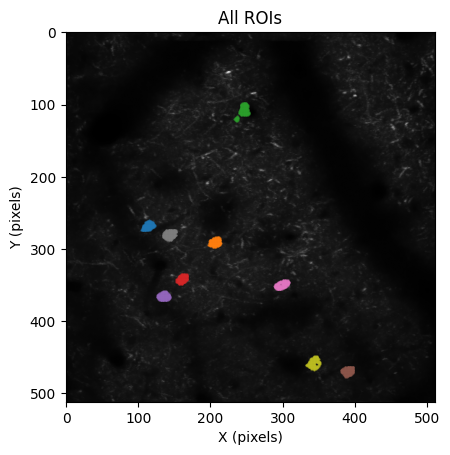

In [65]:
plt.imshow(max_projection, cmap='gray', origin='upper', aspect='equal')

for pm in roi_table.pixel_mask[:]:
    plt.scatter(pm['x'], pm['y'], s=0.5, alpha=0.5)

plt.title('All ROIs')
plt.xlabel('X (pixels)') 
plt.ylabel('Y (pixels)')
plt.show()

# Note - is this the correct projection image to show? Am I plotting ROIs correctly.... I don't really see all the ROIs in the image 

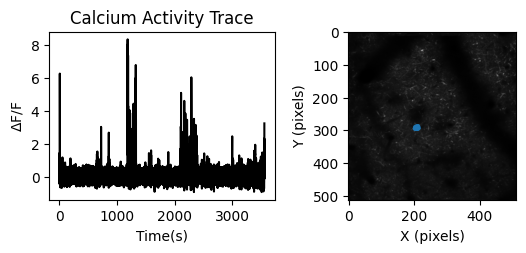

In [66]:
ROI = 1

plt.subplot(2, 2, 1)
plt.plot(ts, dff[:, ROI], 
         label=f'ROI {ROI}', 
         color='black')
plt.ylabel(r'$\Delta$F/F')
plt.xlabel('Time(s)')
plt.title('Calcium Activity Trace')

plt.subplot(2, 2, 2) 
plt.imshow(max_projection, cmap='gray', origin='upper', aspect='equal')

pm = roi_table.pixel_mask[ROI]
plt.scatter(pm['x'], pm['y'], s=0.5, alpha=0.5)
plt.xlabel('X (pixels)') 
plt.ylabel('Y (pixels)')
plt.show()


In [67]:
# Epoch and Stimulus Tables 

nwb.intervals

{'epochs': epochs pynwb.epoch.TimeIntervals at 0x139750184427040
 Fields:
   colnames: ['stim_name' 'start_time' 'stop_time' 'duration']
   columns: (
     stim_name <class 'hdmf.common.table.VectorData'>,
     start_time <class 'hdmf.common.table.VectorData'>,
     stop_time <class 'hdmf.common.table.VectorData'>,
     duration <class 'hdmf.common.table.VectorData'>
   )
   description: Start and stop times for all stimulus epochs
   id: id <class 'hdmf.common.table.ElementIdentifiers'>,
 'stimulus_table': stimulus_table pynwb.epoch.TimeIntervals at 0x139750183644208
 Fields:
   colnames: ['stim_name' 'start_time' 'stop_time' 'temporal_frequency'
  'spatial_frequency' 'center_azimuth' 'center_elevation' 'direction'
  'frame' 'image_order' 'image_index' 'stimulus_condition_id']
   columns: (
     stim_name <class 'hdmf.common.table.VectorData'>,
     start_time <class 'hdmf.common.table.VectorData'>,
     stop_time <class 'hdmf.common.table.VectorData'>,
     temporal_frequency <class 'hdmf.common.table.VectorData'>,
     spatial_frequency <class 'hdmf.common.table.VectorData'>,
     center_azimuth <class 'hdmf.common.table.VectorData'>,
     center_elevation <class 'hdmf.common.table.VectorData'>,
     direction <class 'hdmf.common.table.VectorData'>,
     frame <class 'hdmf.common.table.VectorData'>,
     image_order <class 'hdmf.common.table.VectorData'>,
     image_index <class 'hdmf.common.table.VectorData'>,
     stimulus_condition_id <class 'hdmf.common.table.VectorData'>
   )
   description: Trial times & parameters all stimulus
   id: id <class 'hdmf.common.table.ElementIdentifiers'>}

In [68]:
epochs = nwb.intervals['epochs'].to_dataframe()
epochs

,stim_name,start_time,stop_time,duration
id,,,,
0,drifting_gratings_full,52.851639,340.074066,287.222412
1,drifting_gratings_windowed,343.093262,630.315857,287.222595
2,locally_sparse_noise,633.335022,873.551819,240.216797
3,spontaneous,874.536011,1174.769409,300.233398
4,natural_images_12,1177.788696,1329.898682,152.109985
5,natural_movie,1341.925293,1792.283813,450.358521
6,locally_sparse_noise,1796.337280,2096.453857,300.116577
7,natural_images,2098.555664,2397.721436,299.165771
8,drifting_gratings_windowed,2412.817383,2700.039795,287.222412


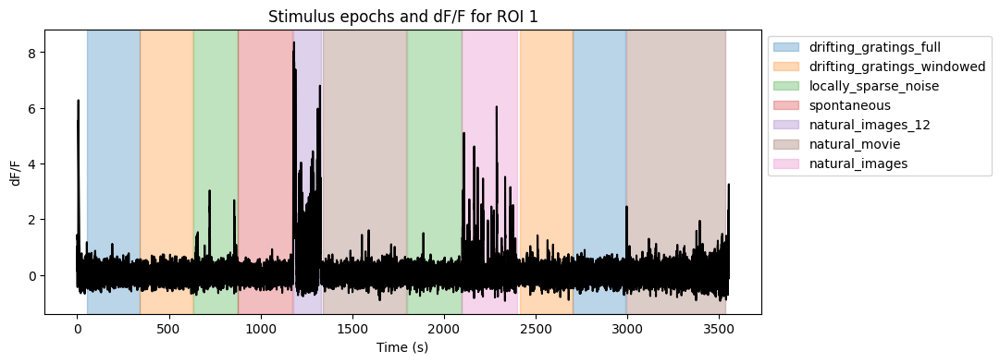

In [69]:
epochs = nwb.intervals['epochs'].to_dataframe()

# Get unique stimulus names and assign colors for plotting 
names = epochs.stim_name.unique()
colors = dict(zip(names, plt.cm.tab10.colors))

plt.figure(figsize=(10, 4))
plt.plot(ts, dff[:, ROI], color='black') # plot neural activity trace 

for name in names:
    stim = epochs[epochs.stim_name == name]        # all epochs with this name

    for i, (start, stop) in enumerate(zip(stim.start_time, stim.stop_time)):
        plt.axvspan(start, stop,
                    color=colors[name],
                    alpha=0.3,
                    label=name if i == 0 else None)     # label only the first

plt.ylabel('dF/F')
plt.xlabel('Time (s)')
plt.title(f'Stimulus epochs and dF/F for ROI {ROI}')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.show()


# questions - what is natural_images_12? look up in data book 

In [ ]:
# See the presentation of each stimulus 
stimulus_table = nwb.intervals['stimulus_table'].to_dataframe()

stimulus_table

# what are some useful features to call out here from the table? 

,stim_name,start_time,stop_time,temporal_frequency,spatial_frequency,center_azimuth,center_elevation,direction,frame,image_order,image_index,stimulus_condition_id
id,,,,,,,,,,,,
0,drifting_gratings_full,52.851639,54.836639,1.0,0.08,0.0,0.0,300.0,NaN,NaN,NaN,22
1,drifting_gratings_full,55.854118,57.839161,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,24
2,drifting_gratings_full,58.856628,60.841621,1.0,0.04,0.0,0.0,300.0,NaN,NaN,NaN,10
3,drifting_gratings_full,61.859138,63.844120,1.0,0.04,0.0,0.0,240.0,NaN,NaN,NaN,8
4,drifting_gratings_full,64.861656,66.846611,1.0,0.08,0.0,0.0,330.0,NaN,NaN,NaN,23
...,...,...,...,...,...,...,...,...,...,...,...,...
33209,natural_movie,3535.585693,3535.602295,NaN,NaN,NaN,NaN,NaN,895.0,NaN,NaN,2668
33210,natural_movie,3535.618896,3535.635742,NaN,NaN,NaN,NaN,NaN,896.0,NaN,NaN,2669
33211,natural_movie,3535.652344,3535.668945,NaN,NaN,NaN,NaN,NaN,897.0,NaN,NaN,2670


In [ ]:
# Narrow down table - how many trials of each stimulus type were there? 

stimulus_table.stim_name.value_counts()

# could also use: stimulus_table.groupby('stim_name').size()


stim_name
natural_movie                 29700
locally_sparse_noise           1705
natural_images                  944
natural_images_12               480
drifting_gratings_full          192
drifting_gratings_windowed      192
spontaneous                       1
Name: count, dtype: int64

In [100]:
# Narrow down table - how many times were each natural image stimulus presented? 
stimulus_table[stimulus_table.stim_name == 'natural_images'].stimulus_condition_id.value_counts()

stimulus_condition_id
1643    8
1644    8
1645    8
1646    8
1647    8
       ..
1756    8
1757    8
1758    8
1759    8
1760    8
Name: count, Length: 118, dtype: int64

In [70]:
# There are a lot of responses to the natural images 
# We can see (some) of the stimuli presented in the nwb.stimulus container

nwb.stimulus

{'locally_sparse_noise': locally_sparse_noise pynwb.base.Images at 0x139750052803408
 Fields:
   description: Locally sparse noise images
   images: {
     0 <class 'pynwb.image.GrayscaleImage'>,
     1 <class 'pynwb.image.GrayscaleImage'>,
     10 <class 'pynwb.image.GrayscaleImage'>,
     100 <class 'pynwb.image.GrayscaleImage'>,
     1000 <class 'pynwb.image.GrayscaleImage'>,
     1001 <class 'pynwb.image.GrayscaleImage'>,
     1002 <class 'pynwb.image.GrayscaleImage'>,
     1003 <class 'pynwb.image.GrayscaleImage'>,
     1004 <class 'pynwb.image.GrayscaleImage'>,
     1005 <class 'pynwb.image.GrayscaleImage'>,
     1006 <class 'pynwb.image.GrayscaleImage'>,
     1007 <class 'pynwb.image.GrayscaleImage'>,
     1008 <class 'pynwb.image.GrayscaleImage'>,
     1009 <class 'pynwb.image.GrayscaleImage'>,
     101 <class 'pynwb.image.GrayscaleImage'>,
     1010 <class 'pynwb.image.GrayscaleImage'>,
     1011 <class 'pynwb.image.GrayscaleImage'>,
     1012 <class 'pynwb.image.GrayscaleImage'>,
     1013 <class 'pynwb.image.GrayscaleImage'>,
     1014 <class 'pynwb.image.GrayscaleImage'>,
     1015 <class 'pynwb.image.GrayscaleImage'>,
     1016 <class 'pynwb.image.GrayscaleImage'>,
     1017 <class 'pynwb.image.GrayscaleImage'>,
     1018 <class 'pynwb.image.GrayscaleImage'>,
     1019 <class 'pynwb.image.GrayscaleImage'>,
     102 <class 'pynwb.image.GrayscaleImage'>,
     1020 <class 'pynwb.image.GrayscaleImage'>,
     1021 <class 'pynwb.image.GrayscaleImage'>,
     1022 <class 'pynwb.image.GrayscaleImage'>,
     1023 <class 'pynwb.image.GrayscaleImage'>,
     1024 <class 'pynwb.image.GrayscaleImage'>,
     1025 <class 'pynwb.image.GrayscaleImage'>,
     1026 <class 'pynwb.image.GrayscaleImage'>,
     1027 <class 'pynwb.image.GrayscaleImage'>,
     1028 <class 'pynwb.image.GrayscaleImage'>,
     1029 <class 'pynwb.image.GrayscaleImage'>,
     103 <class 'pynwb.image.GrayscaleImage'>,
     1030 <class 'pynwb.image.GrayscaleImage'>,
     1031 <class 'pynwb.image.GrayscaleImage'>,
     1032 <class 'pynwb.image.GrayscaleImage'>,
     1033 <class 'pynwb.image.GrayscaleImage'>,
     1034 <class 'pynwb.image.GrayscaleImage'>,
     1035 <class 'pynwb.image.GrayscaleImage'>,
     1036 <class 'pynwb.image.GrayscaleImage'>,
     1037 <class 'pynwb.image.GrayscaleImage'>,
     1038 <class 'pynwb.image.GrayscaleImage'>,
     1039 <class 'pynwb.image.GrayscaleImage'>,
     104 <class 'pynwb.image.GrayscaleImage'>,
     1040 <class 'pynwb.image.GrayscaleImage'>,
     1041 <class 'pynwb.image.GrayscaleImage'>,
     1042 <class 'pynwb.image.GrayscaleImage'>,
     1043 <class 'pynwb.image.GrayscaleImage'>,
     1044 <class 'pynwb.image.GrayscaleImage'>,
     1045 <class 'pynwb.image.GrayscaleImage'>,
     1046 <class 'pynwb.image.GrayscaleImage'>,
     1047 <class 'pynwb.image.GrayscaleImage'>,
     1048 <class 'pynwb.image.GrayscaleImage'>,
     1049 <class 'pynwb.image.GrayscaleImage'>,
     105 <class 'pynwb.image.GrayscaleImage'>,
     1050 <class 'pynwb.image.GrayscaleImage'>,
     1051 <class 'pynwb.image.GrayscaleImage'>,
     1052 <class 'pynwb.image.GrayscaleImage'>,
     1053 <class 'pynwb.image.GrayscaleImage'>,
     1054 <class 'pynwb.image.GrayscaleImage'>,
     1055 <class 'pynwb.image.GrayscaleImage'>,
     1056 <class 'pynwb.image.GrayscaleImage'>,
     1057 <class 'pynwb.image.GrayscaleImage'>,
     1058 <class 'pynwb.image.GrayscaleImage'>,
     1059 <class 'pynwb.image.GrayscaleImage'>,
     106 <class 'pynwb.image.GrayscaleImage'>,
     1060 <class 'pynwb.image.GrayscaleImage'>,
     1061 <class 'pynwb.image.GrayscaleImage'>,
     1062 <class 'pynwb.image.GrayscaleImage'>,
     1063 <class 'pynwb.image.GrayscaleImage'>,
     1064 <class 'pynwb.image.GrayscaleImage'>,
     1065 <class 'pynwb.image.GrayscaleImage'>,
     1066 <class 'pynwb.image.GrayscaleImage'>,
     1067 <class 'pynwb.image.GrayscaleImage'>,
     1068 <class 'pynwb.image.GrayscaleImage'>,
     1069 <class 'pynwb.image.GrayscaleImage'>,
     107 <class 'pynwb.i

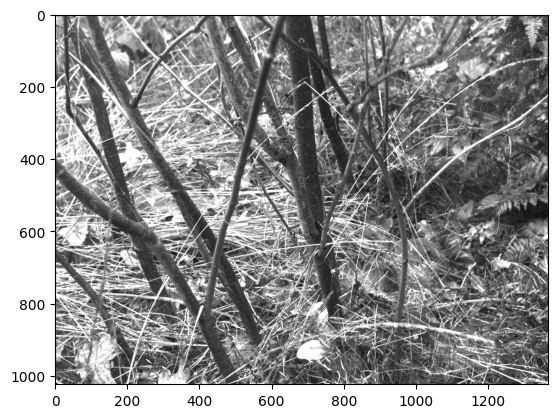

In [ ]:
# Question - does the stimulus_condition_id relate to the numbers in the nwb.stimulus? seems like no.... but is there another way to relate? 
plt.imshow(nwb.stimulus['natural_images']['10'], cmap = 'gray')

In [127]:
stimulus_table[stimulus_table.stimulus_condition_id == 1768].head()

,stim_name,start_time,stop_time,temporal_frequency,spatial_frequency,center_azimuth,center_elevation,direction,frame,image_order,image_index,stimulus_condition_id
id,,,,,,,,,,,,
951,natural_images_12,1177.788696,1178.088867,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
963,natural_images_12,1181.591797,1181.891968,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
975,natural_images_12,1185.394897,1185.695190,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
987,natural_images_12,1189.198120,1189.498291,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
999,natural_images_12,1193.001343,1193.301636,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768


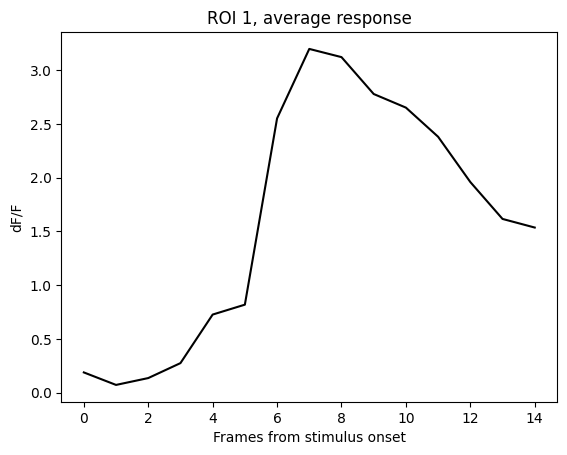

In [135]:
# Plot neural activity response to stimulus presentation 1768 (+ 15 frames) 
n_frames = 15
ROI = 1
stimulus_id = 1768
trace = np.asarray(dff[:, ROI])
stim_start = stimulus_table[stimulus_table.stimulus_condition_id == stimulus_id].start_time.values

stim_dff = []
for start in stim_start:
    i = np.searchsorted(ts, start)          # time → frame index
    stim_dff.append(trace[i : i + n_frames])

stim_dff = np.array(stim_dff)
mean = stim_dff.mean(axis=0)

plt.plot(mean, color='black')
plt.xlabel('Frames from stimulus onset')
plt.ylabel('dF/F')
plt.title(f'ROI {ROI}, average response')
plt.show()

In [ ]:
# to do - 
# plot all the ROIs responses during the natural images 

# find preferred responses 

In [ ]:
# plot in response to running activity and pupil activity 

In [ ]:
# go back to readme - is there anything else we want to call out about the dataset? 

# events? 